# Recherche informée

CSI 4106 - automne 2026

Marcel Turcotte  
Version: août 9, 2026 12h46

# Préambule

## Message du jour

![](https://www.utoronto.ca/sites/default/files/2025-10/ai-2025-group.jpg)

[7 U of T community members named in Observer A.I. Power
Index](https://www.utoronto.ca/celebrates/7-u-t-community-members-named-observer-ai-power-index),
2025-10-08.

## Objectifs d’apprentissage

- **Comprendre** les stratégies de recherche informée et le rôle des
  fonctions heuristiques dans l’efficacité de la recherche.

- **Implémenter** et comparer BFS, DFS, et la recherche par meilleur
  choix (Best-First Search) en utilisant le problème du puzzle à 8
  cases.

- **Analyser** la performance et l’optimalité de divers algorithmes de
  recherche.

# Résumé

## Problème de recherche

- Un ensemble d’**états**, appelé **espace d’états**.

- Un **état initial** où l’agent commence.

- Un ou plusieurs **états objectifs** qui définissent des résultats
  réussis.

- Un ensemble d’**actions** disponibles dans un état donné $s$.

- Un **modèle de transition** qui détermine l’état suivant en fonction
  de l’état actuel et de l’action sélectionnée.

- Une **fonction de coût d’action** qui spécifie le coût de l’exécution
  de l’action $a$ dans l’état $s$ pour atteindre l’état $s'$.

## Définitions

- Un **chemin** est défini comme une séquence d’actions.

- Une **solution** est un chemin qui relie l’état initial à l’état
  objectif.

- Une **solution optimale** est le chemin avec le coût le plus bas parmi
  toutes les solutions possibles.

Nous supposons que le **coût du chemin** est la somme des coûts
individuels des actions, et que tous les coûts sont positifs. L’espace
d’états peut être conceptualisé comme un **graphe**, où les nœuds
représentent les états et les arêtes correspondent aux actions.

Dans certains problèmes, plusieurs solutions optimales peuvent exister.
Cependant, il est généralement suffisant d’identifier et de rapporter
une seule solution optimale. Fournir toutes les solutions optimales peut
considérablement augmenter la complexité en temps et en espace pour
certains problèmes.

## Exemple : 8-Puzzle

In [1]:
import random
import matplotlib.pyplot as plt
import numpy as np

random.seed(58)

def is_solvable(tiles):
    # Compter les inversions dans la liste à plat des tuiles (en excluant l'espace vide)
    inversions = 0
    for i in range(len(tiles)):
        for j in range(i + 1, len(tiles)):
            if tiles[i] != 0 and tiles[j] != 0 and tiles[i] > tiles[j]:
                inversions += 1
    return inversions % 2 == 0

def generate_solvable_board():
    # Générer une configuration de plateau aléatoire qui est garantie d'être résoluble
    tiles = list(range(9))
    random.shuffle(tiles)
    while not is_solvable(tiles):
        random.shuffle(tiles)

    return tiles

def plot_board(board, title, num_pos, position):
    ax = plt.subplot(1, num_pos, position)
    ax.set_title(title)
    ax.set_xticks([])
    ax.set_yticks([])

    board = np.array(board).reshape(3, 3).tolist() # Reconfigurer en une grille 3x3

    # Utiliser une carte de couleurs pour afficher les numéros
    cmap = plt.cm.plasma
    norm = plt.Normalize(vmin=-1, vmax=8)

    for i in range(3):
        for j in range(3):
            tile_value = board[i][j]
            color = cmap(norm(tile_value))
            ax.add_patch(plt.Rectangle((j, 2 - i), 1, 1, facecolor=color, edgecolor='black'))
            if tile_value == 0:
                ax.add_patch(plt.Rectangle((j, 2 - i), 1, 1, facecolor='white', edgecolor='black'))
            else:
                ax.text(j + 0.5, 2 - i + 0.5, str(tile_value),
                        fontsize=16, ha='center', va='center', color='black')

    ax.set_xlim(0, 3)
    ax.set_ylim(0, 3)

## Exemple : 8-Puzzle

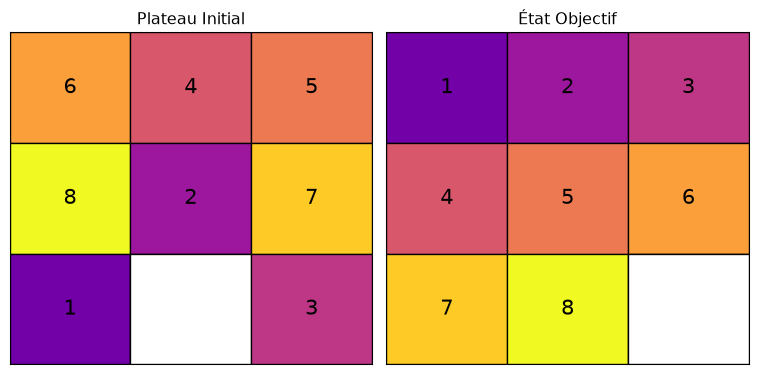

In [2]:
def main():
    # Générer un plateau initial résoluble
    initial_board = generate_solvable_board()

    # Définir l'état objectif
    goal_board = [
        [1, 2, 3],
        [4, 5, 6],
        [7, 8, 0]
    ]

    # Tracer les deux plateaux
    plt.figure(figsize=(8, 4))
    plot_board(initial_board, "Plateau Initial", 2, 1)
    plot_board(goal_board, "État Objectif", 2, 2)
    plt.tight_layout()
    plt.show()

main()

## Arbre de recherche

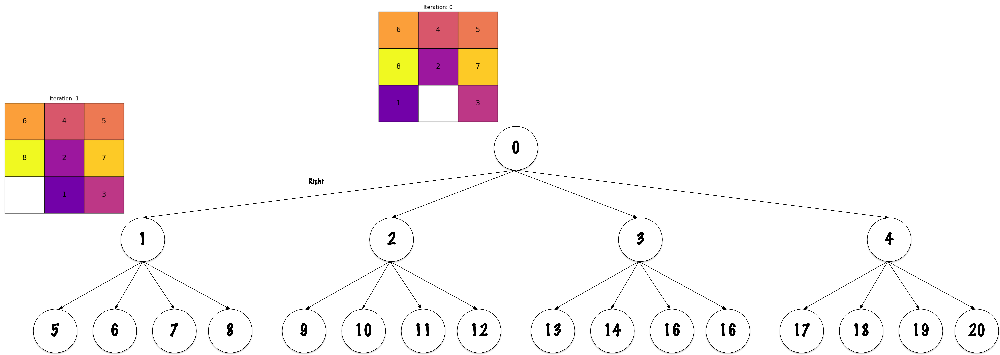

Un **arbre de recherche** est une *structure d’arbre conceptuelle* où
les **nœuds** représentent des *états* dans un **espace d’états**, et
les **arêtes** représentent les **actions** possibles, facilitant
l’exploration systématique pour trouver un **chemin** d’un **état
initial** à un **état objectif**.

Les algorithmes de recherche que nous examinons aujourd’hui construisent
un arbre de recherche, où chaque nœud représente un état au sein de
l’espace d’états et chaque arête représente une action.

Il est important de distinguer entre l’arbre de recherche et l’espace
d’états, qui peut être représenté comme un graphe. La structure de
l’arbre de recherche varie en fonction de l’algorithme utilisé pour
aborder le problème de recherche.

## Arbre de recherche



Un exemple d’**arbre de recherche** pour le **8-Puzzle**. La solution
ici est incomplète.

## Frontière



Tout état correspondant à un nœud dans l’arbre de recherche est
considéré comme **atteint**. Les nœuds de la **frontière** sont ceux qui
ont été **atteints** mais n’ont **pas encore été développés**.
Ci-dessus, il y a **10 nœuds développés** et **11 nœuds de frontière**,
ce qui donne un total de 21 nœuds qui ont été **atteints**.

Si aucune solution n’existe, l’algorithme s’arrête lorsque la frontière
devient vide.

La frontière contient toujours au moins un nœud susceptible de mener à
l’objectif.

Dans le contexte du 8-puzzle, le tableau généré admet une solution. À
partir de ce tableau, nous générons tous les voisins possibles.

Chaque fois qu’un nœud $n$ est extrait de la frontière, nous en générons
tous les voisins. Cette opération s’applique à tous les nœuds, y compris
ceux situés sur un chemin optimal.

## Frontière

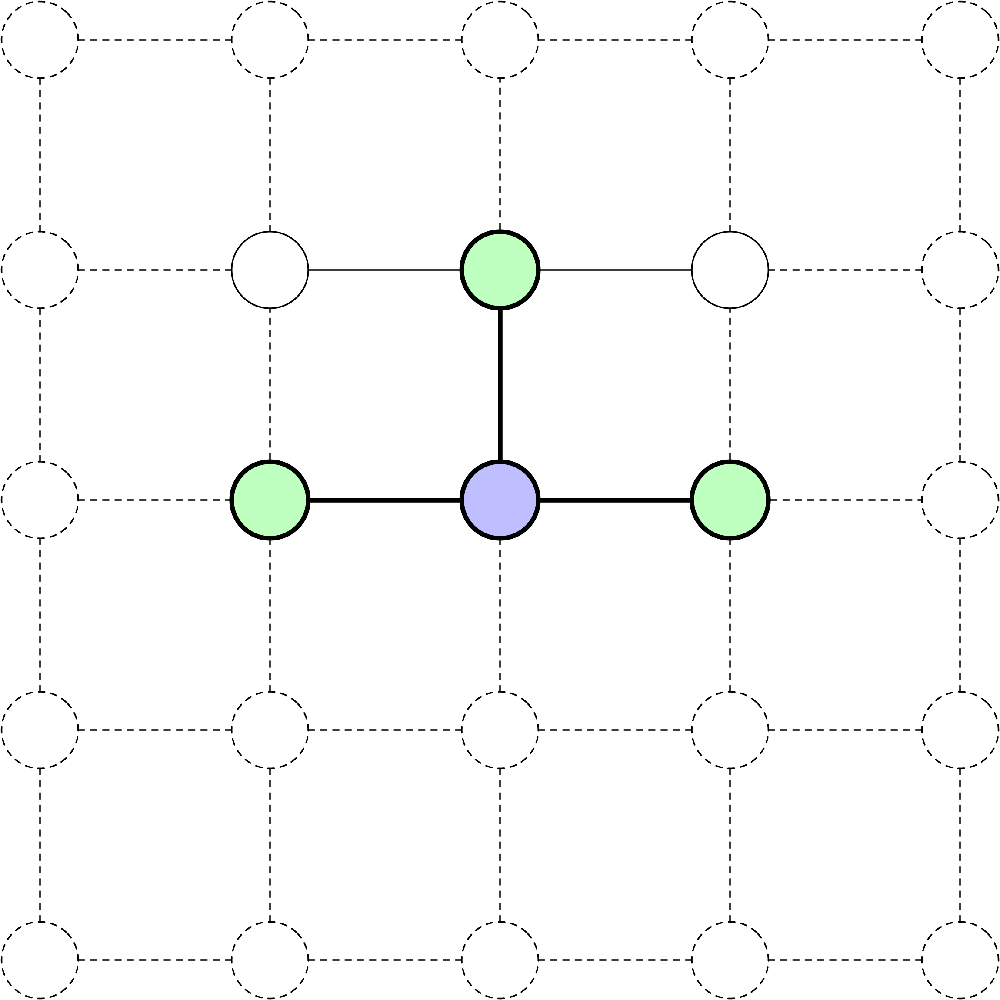

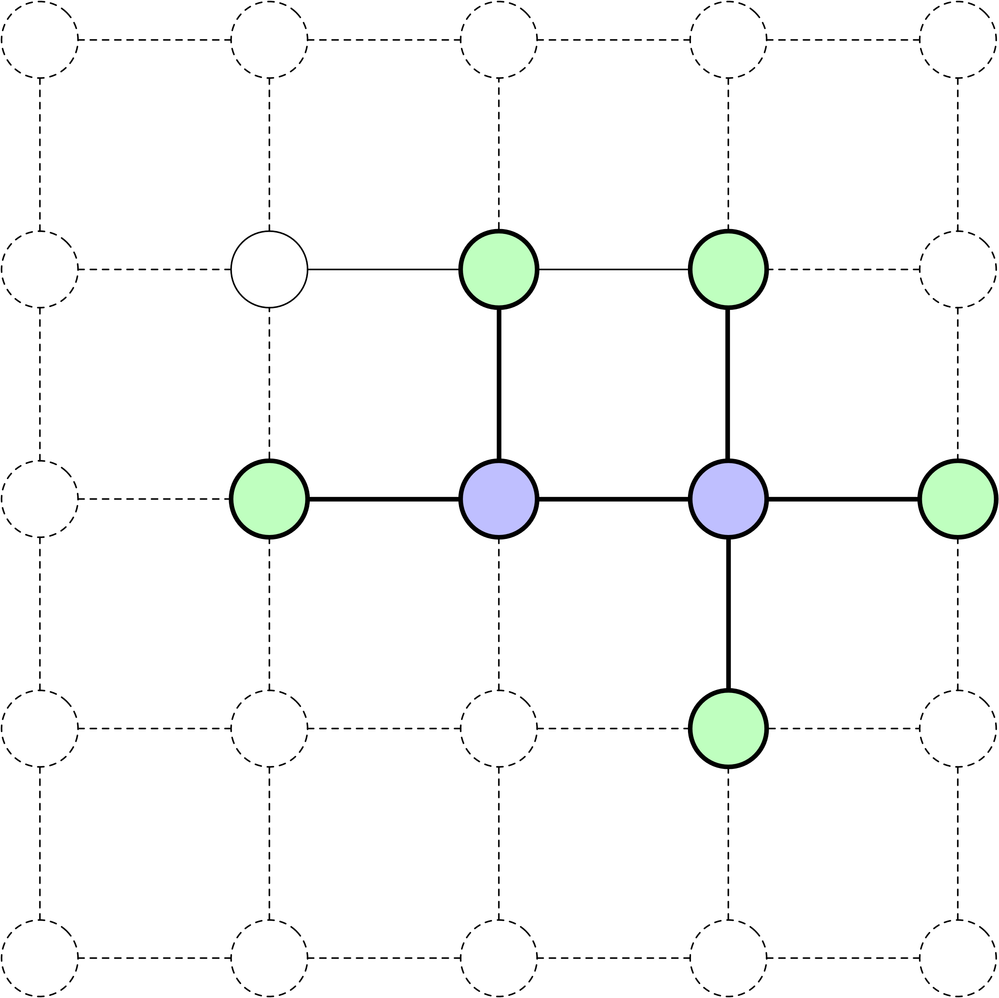

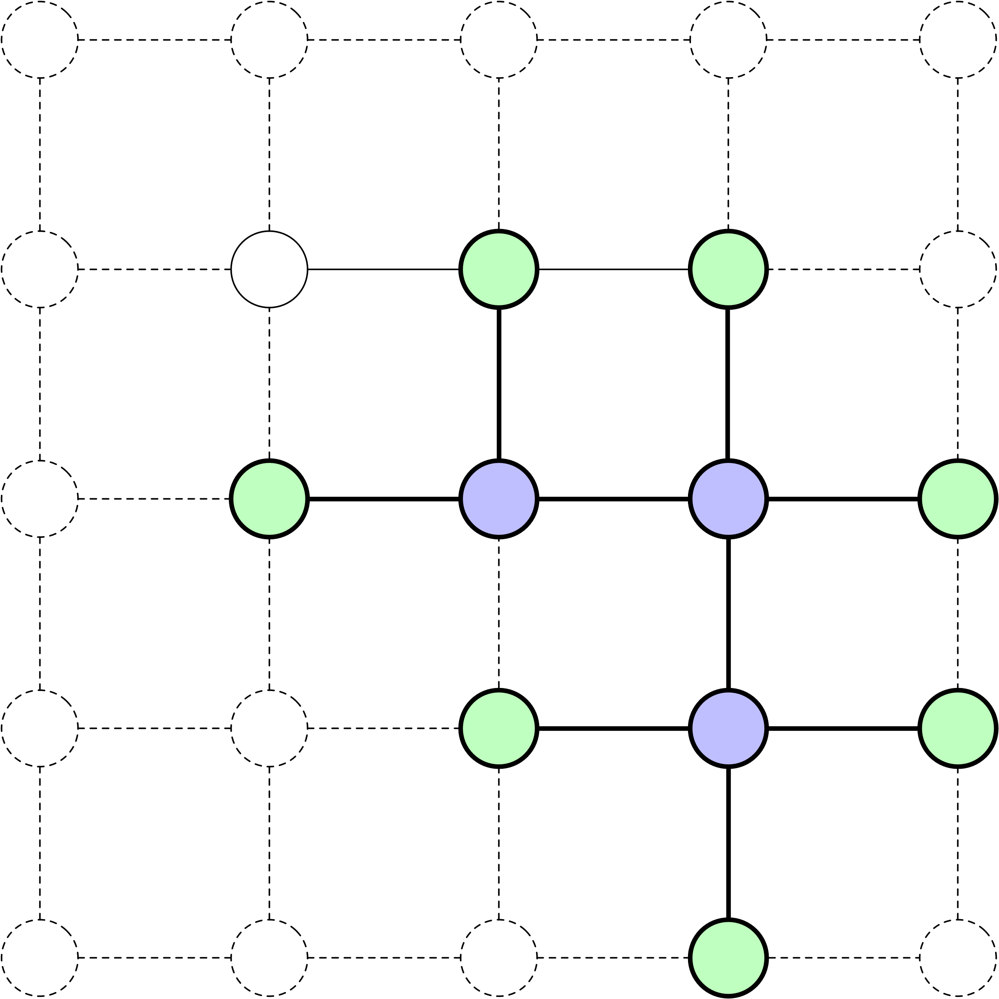

Dans le 8-Puzzle, quatre actions sont possibles : glisser à **gauche**,
à **droite**, vers le **haut** ou vers le **bas**. La recherche peut
être visualisée sur une grille : **nœuds violets** : états développés,
**nœuds verts** : états de la frontière (atteints mais non développés).

Les diagrammes correspondent à l’arbre de recherche présenté sur la page
précédente. Par exemple, l’état initial peut être développé en utilisant
trois actions : glisser à gauche, à droite et vers le haut. Le nœud (2,
3) ne peut être développé qu’en glissant vers le bas, tandis que le nœud
(3, 3) peut être développé en glissant à gauche et vers le bas.

## Frontière

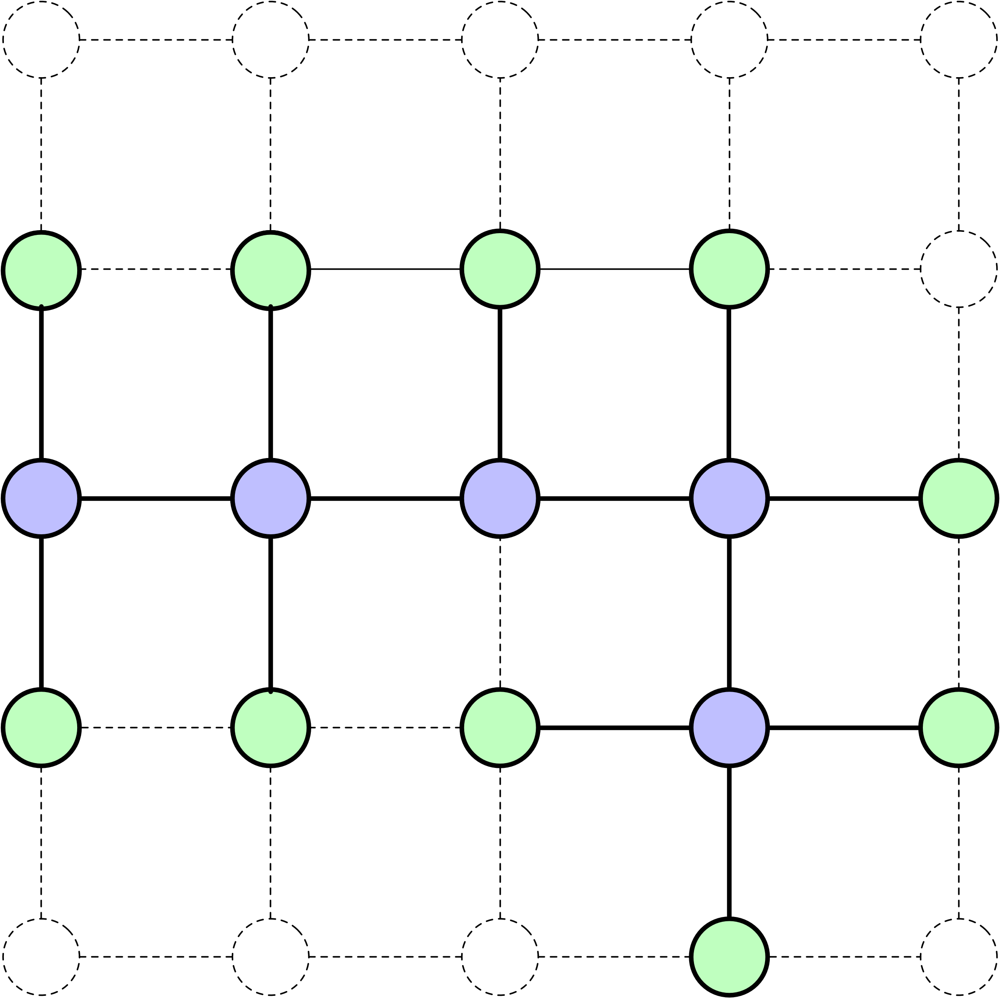

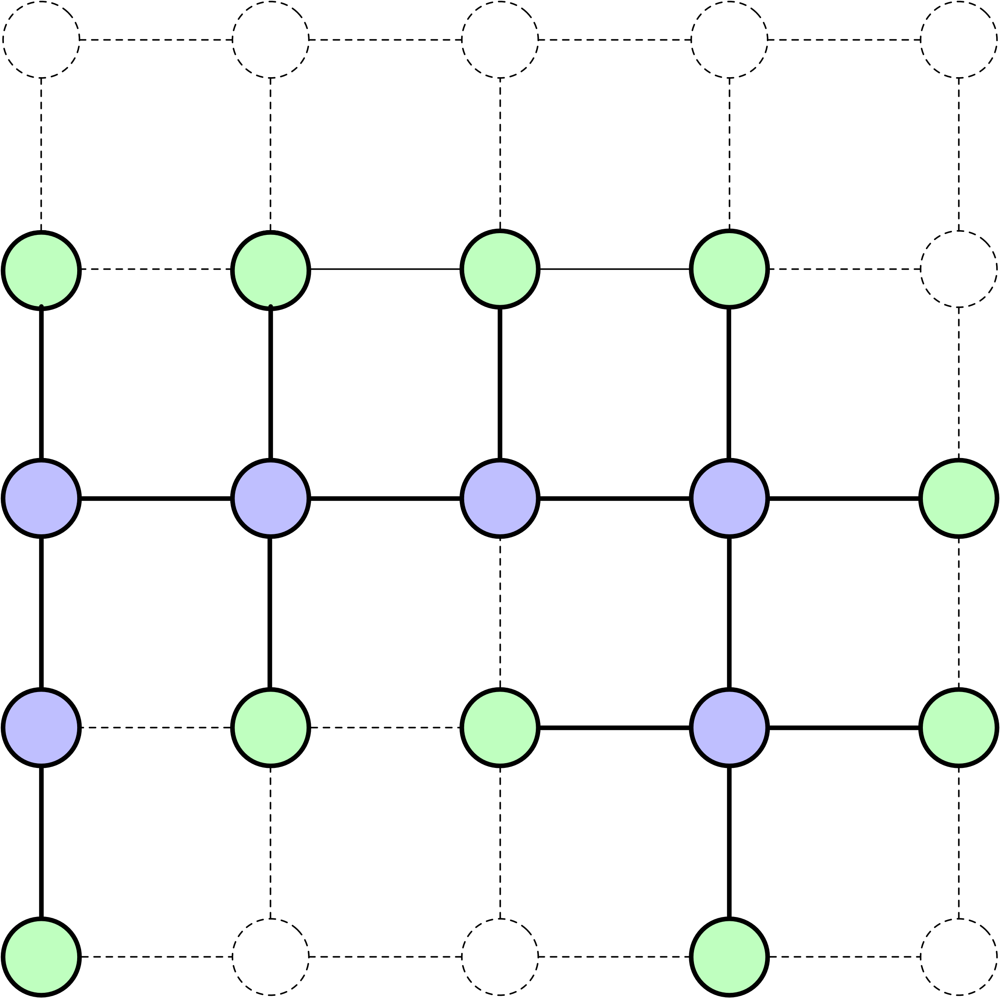

## `is_empty`

In [3]:
def is_empty(frontier):
    """Vérifie si la frontière est vide."""
    return len(frontier) == 0

Si la frontière devient vide (plus de nœuds à développer), le problème
n’a pas de solution.

Existe-t-il des plateaux de 8-Puzzle qui n’ont pas de solutions ?

La résolubilité du 8-Puzzle dépend du nombre d’**inversions** dans
l’état initial. Une inversion est une paire de tuiles où une tuile avec
un numéro plus élevé précède une tuile avec un numéro plus bas lorsque
le puzzle est vu comme une séquence (en excluant la tuile vide).

## `is_goal`

In [4]:
def is_goal(state, goal_state):
    """Détermine si un état donné correspond à l'état objectif."""
    return state == goal_state

Méthode auxiliaire.

## `expand`

In [5]:
def expand(state):
    """Génère les états successeurs en déplaçant la tuile vide dans toutes les directions possibles."""
    size = int(len(state) ** 0.5) # Déterminer la taille du puzzle (3 pour le 8-Puzzle, 4 pour le 15-Puzzle)
    idx = state.index(0) # Trouver l'index de la tuile vide représentée par 0
    x, y = idx % size, idx // size # Convertir l'index en coordonnées (x, y)
    neighbors = []

    # Définir les mouvements possibles : Gauche, Droite, Haut, Bas
    moves = [(-1, 0), (1, 0), (0, -1), (0, 1)]
    for dx, dy in moves:
        nx, ny = x + dx, y + dy
        # Vérifier si la nouvelle position est dans les limites du puzzle
        if 0 <= nx < size and 0 <= ny < size:
            n_idx = ny * size + nx
            new_state = state.copy()
            # Échanger la tuile vide avec la tuile adjacente
            new_state[idx], new_state[n_idx] = new_state[n_idx], new_state[idx]
            neighbors.append(new_state)
    return neighbors

## `print_solution`

In [6]:
def print_solution(solution):
    """Affiche la séquence d'étapes de l'état initial à l'état objectif."""
    size = int(len(solution[0]) ** 0.5)
    for step, state in enumerate(solution):
        print(f"Étape {step} :")
        for i in range(size):
            row = state[i*size:(i+1)*size]
            print(' '.join(str(n) if n != 0 else ' ' for n in row))
        print()

## Recherche en largeur

In [7]:
from collections import deque

La **recherche en largeur (BFS)** utilise une **file** pour gérer les
nœuds de la frontière, également connus sous le nom de liste ouverte.

## Recherche en largeur

In [8]:
def bfs(initial_state, goal_state):
    frontier = deque() # Initialiser la file pour BFS
    frontier.append((initial_state, [])) # Chaque élément est un tuple : (état, chemin)

    explored = set()
    explored.add(tuple(initial_state))

    iterations = 0 # utilisé simplement pour comparer les algorithmes

    while not is_empty(frontier):
        current_state, path = frontier.popleft()

        if is_goal(current_state, goal_state):
            print(f"Nombre d'itérations : {iterations}")
            return path + [current_state] # Retourner le chemin réussi

        iterations = iterations + 1

        for neighbor in expand(current_state):
            neighbor_tuple = tuple(neighbor)
            if neighbor_tuple not in explored:
                explored.add(neighbor_tuple)
                frontier.append((neighbor, path + [current_state]))

    return None # Aucune solution trouvée

L’utilisation de `tuple` rend les états immuables et “hachables”,
permettant leur stockage dans un ensemble.

## Recherche en profondeur

In [9]:
def dfs(initial_state, goal_state):
    frontier = [(initial_state, [])] # Chaque élément est un tuple : (état, chemin)

    explored = set()
    explored.add(tuple(initial_state))

    iterations = 0

    while not is_empty(frontier):
        current_state, path = frontier.pop()

        if is_goal(current_state, goal_state):
            print(f"Nombre d'itérations : {iterations}")
            return path + [current_state] # Retourner le chemin réussi

        iterations = iterations + 1

        for neighbor in expand(current_state):
            neighbor_tuple = tuple(neighbor)
            if neighbor_tuple not in explored:
                explored.add(neighbor_tuple)
                frontier.append((neighbor, path + [current_state]))

    return None # Aucune solution trouvée

## Remarques

- La **recherche en largeur (BFS)** identifie la solution optimale, 25
  mouvements, en 145 605 itérations.

- La **recherche en profondeur (DFS)** découvre une solution impliquant
  1 157 mouvements en 1 187 itérations.

Comment découvrir des solutions **plus efficacement** ?

La **recherche en profondeur (DFS)** produira-t-elle toujours des
solutions sous-optimales ?

Non, si la solution optimale se trouve le long du chemin parcouru par la
recherche en profondeur (DFS) dans l’arbre de recherche, alors DFS
identifiera effectivement la solution optimale.

Est-il possible que DFS découvre des solutions supérieures à la solution
optimale ?

Certainement pas ; de telles solutions seraient soit invalides
(impliquant des mouvements impossibles), soit indiqueraient une erreur
dans votre estimation.

Cela signifie-t-il que la recherche en profondeur (DFS) n’a pas
d’applications pratiques ?

Quand est-il approprié d’utiliser DFS ?

La recherche en largeur (BFS) étend sa frontière systématiquement dans
toutes les directions, ce qui entraîne une croissance rapide des besoins
en mémoire.

En revanche, l’utilisation de la mémoire de DFS est limitée par le
nombre de mouvements nécessaires pour atteindre ses points de retour en
arrière ou par la longueur du chemin de la première solution trouvée.
Dans tous les scénarios, DFS continue d’étendre la frontière dans une
direction.

Dans certaines applications où toutes les solutions possibles doivent
être explorées, tout l’espace de recherche doit être parcouru. Utiliser
BFS dans ces cas serait prohibitif en termes de mémoire. Cependant, DFS
peut explorer l’ensemble de l’espace avec une utilisation minimale de la
mémoire.

Le langage de programmation Prolog inclut un algorithme de retour en
arrière intégré qui énumère toutes les solutions possibles. Le retour en
arrière est une variante de DFS efficace en mémoire.

La recherche limitée en profondeur et la recherche en approfondissement
itératif seraient des algorithmes de recherche non informée alternatifs.

Trouver des solutions plus efficacement nécessite une connaissance du
domaine.

# Recherche informée

## Recherche heuristique

Les algorithmes de recherche informée utilisent des **connaissances
spécifiques au domaine** concernant l’emplacement de l’état objectif.

## Recherche heuristique

Soit $f(n)$ une **fonction heuristique** qui estime le **coût du chemin
de moindre coût** de l’état ou du nœud actuel $n$ jusqu’à l’objectif.

Cette approche est appelée **recherche du meilleur d’abord**
(*best-first search*).

## Recherche heuristique

Dans les **problèmes de recherche de route**, on pourrait utiliser la
distance en ligne droite de la position actuel à la destination comme
heuristique.

. . .

**Bien qu’un chemin réel puisse ne pas exister le long de cette ligne
droite**, l’algorithme donnera la priorité à l’expansion du nœud le plus
proche de la destination (objectif) en se basant sur cette mesure en
ligne droite.

## Exemple du livre

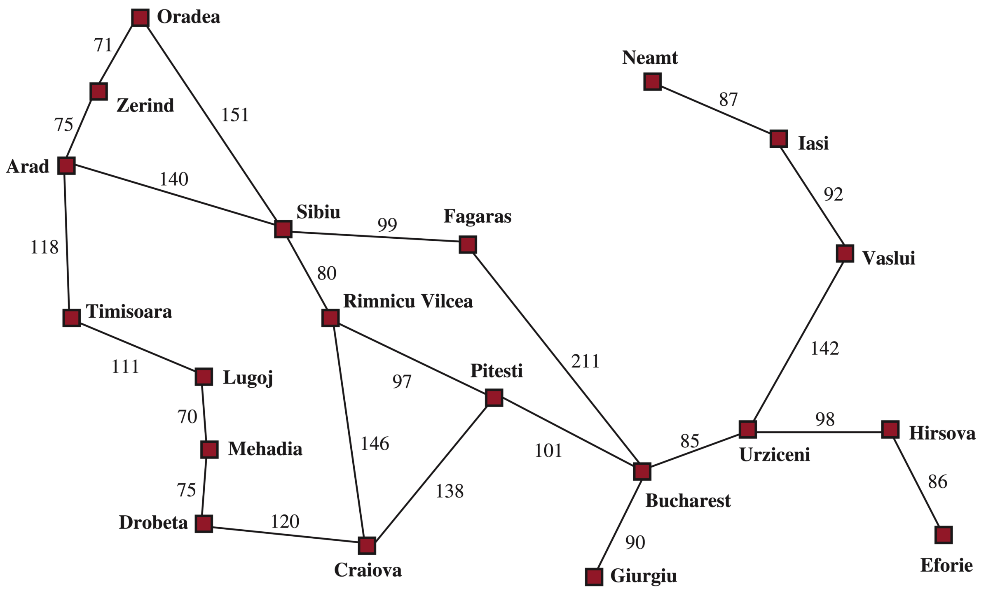

**Source:** (Russell et Norvig 2020, fig. 3.1)

**Problématique :** Déterminer l’itinéraire routier le plus court entre
Arad (état initial) et Bucarest (état objectif).

## Exemple du livre

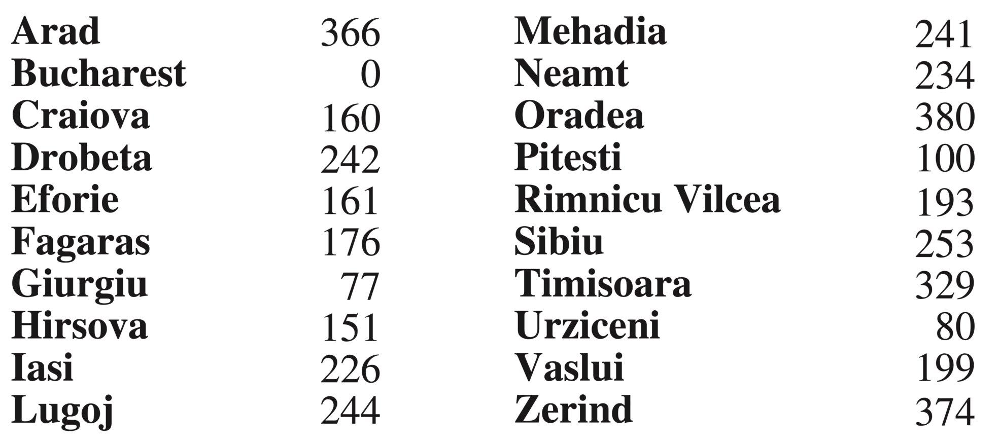

**Source:** (Russell et Norvig 2020, fig. 3.16)

Nous possédons les données concernant les distances euclidiennes
directes (en ligne droite, à vol d’oiseau) entre chacune des villes et
Bucarest.

## Exemple du livre

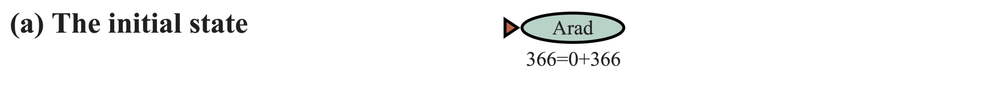

**Source:** (Russell et Norvig 2020, fig. 3.18)

L’état initial est Arad, avec une valeur heuristique de 366. Comme aucun
chemin n’a encore été parcouru, le coût total estimé de cet état est la
somme du coût parcouru, qui est 0, et de la distance euclidienne directe
vers Bucarest, soit $366$.

## Exemple du livre

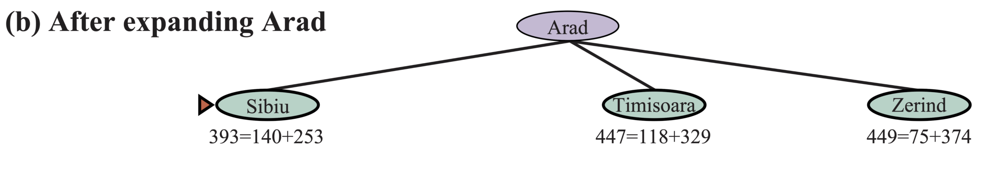

**Source:** (Russell et Norvig 2020, fig. 3.18)

Depuis Arad, trois villes peuvent être atteintes directement : Sibiu,
Timisoara et Zerind. Pour chacune de ces destinations, nous évaluons la
valeur heuristique en additionnant la distance parcourue jusqu’à présent
et la distance euclidienne directe vers la destination finale.

Sibiu possède la valeur heuristique la plus basse et sera ainsi retirée
de la frontière.

## Exemple du livre

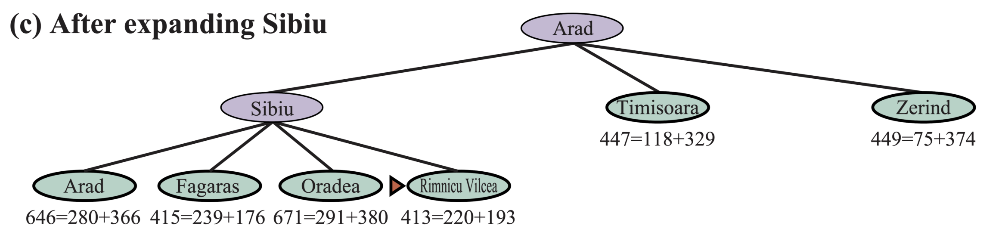

**Source:** (Russell et Norvig 2020, fig. 3.18)

Depuis Sibiu, quatre villes peuvent être atteintes directement : Arad,
Fagaras, Oradea et Rimnicu Vilcea. Pour chacune de ces destinations,
nous évaluons la valeur heuristique en additionnant la distance
parcourue jusqu’à présent et la distance euclidienne directe vers la
destination finale.

Dans cet exemple, les auteurs ont choisis de ne pas détecter les cycles,
ainsi Arad est ajouté à la frontière.

Quelle sera la prochaine ville retirée de la frontière?

Rimnicu Vilcea possède la valeur heuristique la plus basse et sera ainsi
retirée de la frontière.

## Exemple du livre

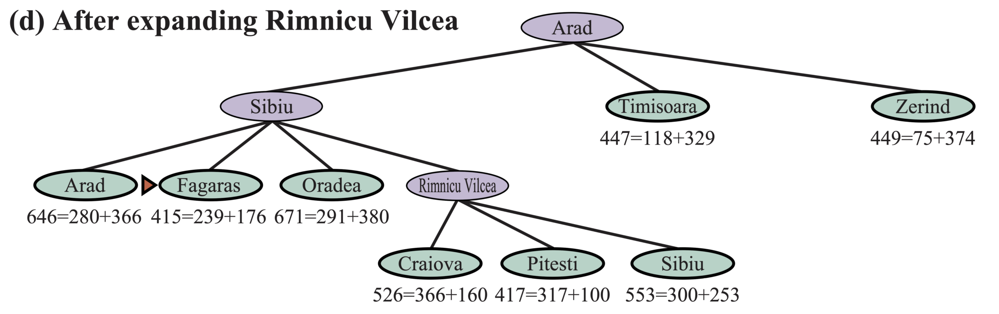

**Source:** (Russell et Norvig 2020, fig. 3.18)

À partir de Rimnicu Vilcea, trois villes sont directement accessibles :
Craiova, Pitesti et Sibiu. Pour évaluer le potentiel de chaque
destination, nous calculons une valeur heuristique en additionnant la
distance déjà parcourue et la distance euclidienne directe jusqu’à la
destination finale.

Il est important de noter que Sibiu est réintroduite dans la frontière.
Sa valeur heuristique actuelle est de 553, résultant de la somme du
chemin parcouru (300) et de la distance euclidienne directe vers
Bucarest (253). Lors de sa première introduction dans la frontière, le
chemin parcouru était de 140, ce qui donnait une valeur heuristique de
393. Bien que Sibiu présente un meilleur potentiel que des trajets
alternatifs comme Arad vers Sibiu puis vers Arad, ou Arad vers Sibiu
puis vers Oradea, elle ne constitue pas une bonne option par rapport aux
autres possibilités.

Quelle sera la prochaine ville retirée de la frontière?

La prochaine ville à être retirée de la frontière sera Fagaras, car elle
présente la plus faible valeur heuristique.

## Exemple du livre

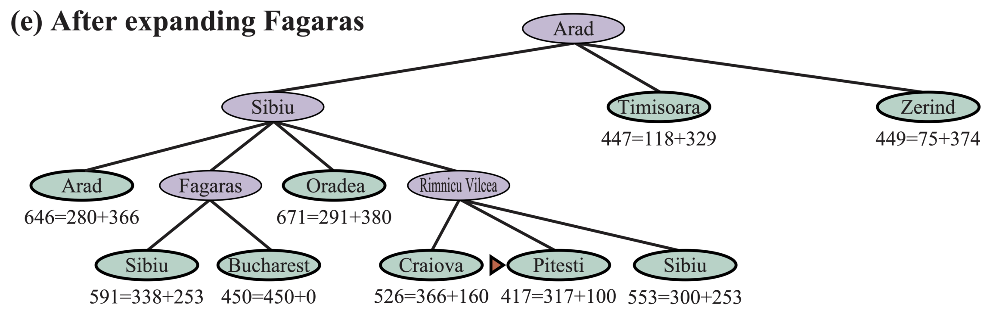

**Source:** (Russell et Norvig 2020, fig. 3.18)

Depuis Fagaras, deux villes peuvent être atteintes directement : Sibiu
et Bucharest. Pour chacune de ces destinations, nous évaluons la valeur
heuristique en additionnant la distance parcourue jusqu’à présent et la
distance euclidienne directe vers la destination finale.

Bien que Bucarest soit l’objectif final, l’algorithme ne s’arrête pas
immédiatement. Après le calcul des valeurs heuristiques, il se peut que
ce chemin ne soit pas le plus prometteur. La valeur heuristique associée
à Bucarest est de 450, ce qui correspond uniquement à la distance déjà
parcourue, étant donné que c’est aussi la destination finale. La
distance euclidienne directe entre le dernier nœud du chemin actuel et
la destination sert d’estimation. Bien que cette estimation soit
initialement peu précise, elle gagne en précision à mesure que l’on se
rapproche de la destination.

**Un aspect crucial de l’algorithme est qu’il ne se termine pas
lorsqu’il atteint l’état objectif; au contraire, il continue jusqu’à ce
que l’état objectif soit retiré de la frontière.** Cela indique qu’aucun
chemin alternatif ne semble plus prometteur.

Les nœuds Pitesti, Timisoara et Zerind, dans cet ordre, présentent des
options plus favorables que Bucarest. Pitesti, possédant la valeur
heuristique la plus faible, sera donc sélectionné pour être retiré de la
frontière.

## Exemple du livre

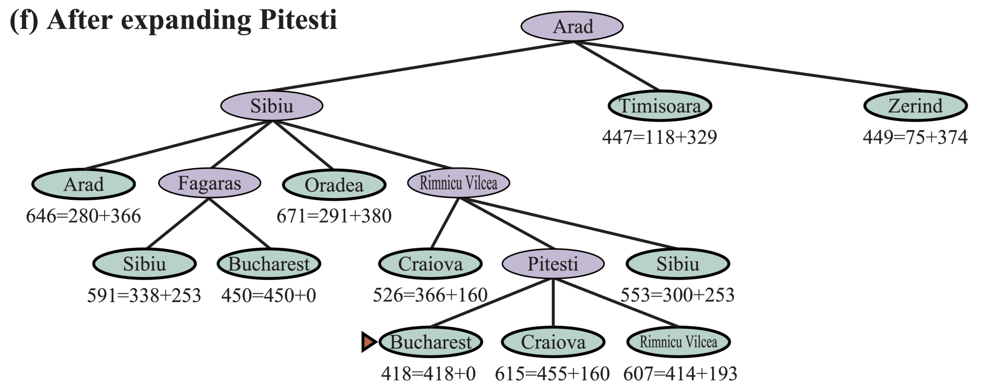

**Source:** (Russell et Norvig 2020, fig. 3.18)

Depuis Pitesti, trois villes peuvent être atteintes directement :
Bucharest, Craiova et Rimnicu Vilcea. Pour chacune de ces destinations,
nous évaluons la valeur heuristique en additionnant la distance
parcourue jusqu’à présent et la distance euclidienne directe vers la
destination finale.

La prochaine ville à être retirée de la frontière sera Bucarest, car
elle présente la plus faible valeur heuristique. C’est aussi l’état
objectif, ainsi s’arrête. Arad, Sibiu, Rimnicu Vilcea, Pitesti, Bucarest
est la solution retournée.

**Est-ce que cette solution a un coût optimal?**

## Implémentation

- Comment peut-on modifier les algorithmes existants de **recherche en
  largeur** et de **recherche en profondeur** pour implémenter la
  **recherche du meilleur d’abord** ?

  - Cela peut être réalisé en utilisant une **file de priorité**, qui
    est triée selon les valeurs de la **fonction heuristique** $f(n)$.

. . .

In [10]:
import heapq

## Observation

La **recherche en largeur** peut être interprétée comme une forme de
recherche du meilleur d’abord, où la fonction heuristique $f(n)$ est
définie comme la **profondeur du nœud dans l’arbre de recherche**,
correspondant à la longueur du chemin.

Cette solution est-elle viable ? La réponse est nuancée. Elle est utile
pour examiner les propriétés de l’algorithme, mais l’utilisation d’une
file offrira probablement une implémentation plus efficace.

Comment pourrait-on implémenter la recherche en profondeur comme une
forme de recherche du meilleur d’abord?

## A-star

$A^\star$ (a-star, a-étoile) est la **recherche informée la plus
courante**.

$$
    f(n) = g(n) + h(n)
$$

où

- $g(n)$ est le coût du chemin depuis l’*état initial* jusqu’à $n$.
- $h(n)$ est une **estimation** du coût du plus court chemin de $n$ à
  l’*état final*.

Hart et al. (1968)

Il est évident que $g(n)$ est une valeur connue et non une estimation.
Par conséquent, la précision de $f(n)$ s’améliore au fur et à mesure de
l’exécution.

## Admissibilité

Une heuristique est **admissible** si *elle ne surestime jamais le coût
réel pour atteindre l’objectif à partir de n’importe quel nœud dans
l’espace de recherche*.

. . .

Cela garantit que l’algorithme $A^\star$ trouve une solution optimale,
puisque le coût estimé est toujours une borne inférieure du coût réel.

Que se passerait-il si une heuristique surestimait le coût du plus court
chemin de $n$ à l’objectif ?

Si une heuristique devait surestimer le coût du chemin le plus court de
$n$ vers l’objectif, alors $A^\star$ pourrait ignorer ou retarder
l’expansion des nœuds qui se trouvent réellement sur le chemin optimal,
car leurs valeurs de $f$ semblent artificiellement élevées. L’algorithme
pourrait toujours trouver une solution, mais pas nécessairement la plus
courte !

## Admissibilité

Formellement, une heuristique $h(n)$ est admissible si : $$
h(n) \leq h^*(n)
$$ où :

- $h(n)$ est l’estimation heuristique du coût depuis le nœud $n$ jusqu’à
  l’objectif.
- $h^*(n)$ est le coût réel du chemin optimal depuis le nœud $n$ jusqu’à
  l’objectif.

Si une heuristique surestime le coût du plus court chemin entre $n$ et
l’objectif, alors $A^\star$ pourrait ignorer ou retarder l’expansion de
nœuds qui se trouvent en réalité sur le chemin optimal, car leurs
valeurs de $f$ paraissent artificiellement trop élevées. L’algorithme
peut encore trouver une solution, mais pas nécessairement la plus courte
!

## Optimalité de coût

L’**optimalité de coût** se réfère à la capacité d’un algorithme à
trouver la solution de moindre coût parmi toutes les solutions
possibles.

. . .

Dans le contexte des algorithmes de recherche comme $A^\star$,
l’optimalité de coût signifie que l’algorithme identifiera le chemin
avec le coût total le plus bas depuis le départ jusqu’à l’objectif, à
condition qu’une heuristique admissible soit utilisée.

## Théorème

Soit $h$ **admissible**, c’est-à-dire $0\le h(n)\le h^\star(n)$ pour
tous les nœuds $n$, où $h^\star(n)$ est le coût réel de $n$ à un
objectif.

. . .

Supposons des coûts d’action non négatifs et que $A^\star$ **se termine
lorsqu’un objectif est sélectionné pour expansion** (c’est-à-dire,
retiré de la **frontière**).

. . .

Alors $A^\star$ renvoie une solution optimale.

**Voir aussi :** [Berkeley, CS 188, *Automne 2022 — Note de cours 02 :
“Recherche
informée”*](https://inst.eecs.berkeley.edu/~cs188/fa22/assets/notes/cs188-fa22-note02.pdf),
2 septembre 2022.

## Preuve

1.  **Supposons pour contradiction**

Supposons que $A^\star$ renvoie un objectif sous-optimal $G$ avec un
coût $C > C^\star$, où $C^*$ est le coût de la solution optimale.

Quand $A^\star$ s’arrête, $G$ vient d’être sélectionné de la frontière
avec $f(G)=g(G)=C$.

## Preuve

1.  **Borne inférieure le long de tout chemin optimal**

Considérons un nœud $n$ sur un chemin vers un objectif optimal $G^\star$
(coût $C^\star$).

Par admissibilité,

$$
   f(n) = g(n) + h(n)\ \le\ g(n) + h^\star(n) = C^\star
$$

Ainsi, chaque nœud sur un chemin optimal a $f(n) \le C^\star$.

## Preuve

1.  **Le premier nœud non-expansé est dans la frontière**

Quand $G$ est choisi, marchez depuis le début le long d’un chemin
optimal vers $G^\star$ jusqu’à atteindre le **premier nœud $n$ qui n’a
pas encore été expansé**.

. . .

Son parent sur ce chemin a été expansé (par définition de “premier”),
donc $n$ a été **généré** et est donc en **frontière**.

. . .

D’après l’étape 2, $f(n)\le C^\star$. Puisque $C^\star < C = f(G)$, la
règle de priorité de $A^\star$ devrait choisir $n$ (ou un autre nœud
avec $f \le C^\star$) avant $G$, une contradiction.

## Preuve

1.  **Conclure l’optimalité**

La contradiction montre que $A^\star$ ne peut pas renvoyer un objectif
avec un coût $>C^\star$; donc la solution renvoyée est optimale.

C.Q.F.D.

## 8-Puzzle

Pouvez-vous penser à une fonction heuristique pour le casse-tête de 8
tuiles ?

## Distance du nombre d’inversions

Peut-on utiliser le nombre d’inversions comme fonction heuristique,
$h(n)$, pour le 8-Puzzle?

. . .

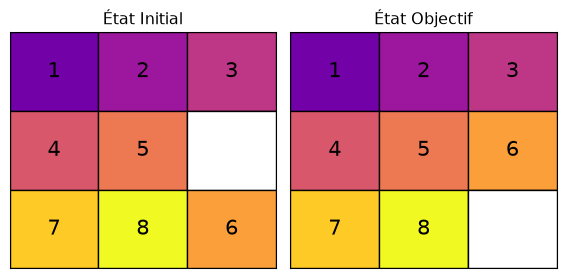

In [11]:
# Définir l'état initial
initial_board = [
    [1, 2, 3],
    [4, 5, 0],
    [7, 8, 6]
]

# Définir l'état objectif
goal_board = [
    [1, 2, 3],
    [4, 5, 6],
    [7, 8, 0]
]

# Tracer les deux plateaux
plt.figure(figsize=(6, 3))
plot_board(initial_board, "État Initial", 2, 1)
plot_board(goal_board, "État Objectif", 2, 2)
plt.tight_layout()
plt.show()

- Calculez $h(s)$ et $h^\star(s)$.
- Qu’en concluez-vous?

Intuitivement, compter le nombre d’inversions dans le taquin 8-puzzle
pourrait sembler constituer une bonne heuristique : les configurations
comportant de nombreuses inversions paraissent plus éloignées de l’état
but, qui n’en contient aucune. Cependant, comme chaque déplacement
modifie le nombre d’inversions de 0 ou 2, cette mesure n’est ni
cohérente ni admissible pour estimer le progrès vers la solution.

Pour la configuration initiale du plateau, la fonction heuristique
$h(s)$ a une valeur de 2, tandis que le coût optimal, noté $h^\star(s)$,
est 1. Donc, $h(s) = 2 > h^\star(s) = 1$. Comme le nombre d’inversions
peut surestimer le coût réel, il ne peut pas être considéré comme une
heuristique admissible. En effet, un seul mouvement peut altérer l’ordre
relatif de la tuile déplacée par rapport à plusieurs autres tuiles,
diminuant potentiellement le nombre d’inversions de plus de 1 par
mouvement. Par conséquent, le nombre d’inversions ne fournit pas une
borne inférieure valide sur le nombre de mouvements requis.

Soyez prudent lorsque vous construisez des exemples pour raisonner sur
le problème. Par exemple, il peut sembler que la permutation « 1, 2, 3,
4, 5, 6, 0, 8, 7 » ne soit qu’à un seul déplacement de l’état but,
puisqu’elle ne contient qu’une seule inversion. Cependant, rappelez-vous
que la **parité** du nombre d’inversions est invariante : chaque
mouvement la modifie de 0 ou de 2. Comme cette configuration possède un
nombre impair d’inversions, aucune séquence de déplacements ne peut la
transformer en l’état but (la permutation identité).

## Distance des tuiles mal placées

In [12]:
def misplaced_tiles_distance(state, goal_state):
    # Comptez le nombre de tuiles mal placées
    misplaced_tiles = sum(1 for s, g in zip(state, goal_state) if s != g and s != 0)
    return misplaced_tiles

Est-ce que cette heuristique est admissible?

Considérons un mouvement légal quelconque. Il glisse exactement une
tuile dans l’espace vide. Ce mouvement peut fixer **au plus une tuile**
qui était auparavant mal placée ; toutes les autres tuiles conservent
leur statut de “mal placée vs. placée”.

Par conséquent, le long de tout chemin de solution qui utilise $k$
mouvements, le nombre de tuiles mal placées peut diminuer d’au plus $k$.
Si le départ a $h(x)$ tuiles mal placées, toute solution doit avoir une
longueur d’au moins $h(s)$ étapes.

Ainsi, $h(s) \leq h^\star(s)$, c’est-à-dire que l’heuristique est
admissible.

## 8-Puzzle

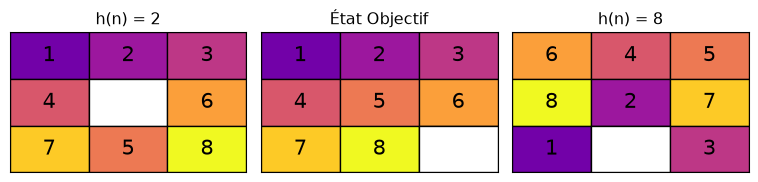

In [13]:
plt.figure(figsize=(8, 2))

initial_state_8a = [1, 2, 3,
                    4, 0, 6,
                    7, 5, 8]

initial_state_8b = [6, 4, 5,
                    8, 2, 7,
                    1, 0, 3]

goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

distance_a = misplaced_tiles_distance(initial_state_8a, goal_state_8)

distance_b = misplaced_tiles_distance(initial_state_8b, goal_state_8)

plot_board(initial_state_8a, f"h(n) = {distance_a}", 3, 1)

plot_board(goal_state_8, "État Objectif", 3, 2)

plot_board(initial_state_8b, f"h(n) = {distance_b}", 3, 3)

plt.tight_layout()
plt.show()

## Recherche du meilleur d’abord

In [14]:
def best_first_search(initial_state, goal_state):

    frontier = []  # Initialisez la file de priorité
    initial_h = misplaced_tiles_distance(initial_state, goal_state)

    # Ajoutez l'état initial avec sa valeur heuristique dans la file
    heapq.heappush(frontier, (initial_h, 0, initial_state, []))  # (f(n), g(n), état, chemin)

    explored = set()
    explored.add(tuple(initial_state))
    iterations = 0

    while not is_empty(frontier):
        f, g, current_state, path = heapq.heappop(frontier)

        if is_goal(current_state, goal_state):
            print(f"Nombre d'itérations : {iterations}")
            return path + [current_state]  # Retournez le chemin réussi

        iterations += 1

        for neighbor in expand(current_state):
            if tuple(neighbor) not in explored:
                new_g = g + 1  # Incrémentez le coût du chemin
                h = misplaced_tiles_distance(neighbor, goal_state)
                new_f = new_g + h  # Calculez le nouveau coût total
                # Ajoutez l'état voisin dans la file de priorité
                heapq.heappush(frontier, (new_f, new_g, neighbor, path + [current_state]))
                explored.add(tuple(neighbor))  # Marquez le voisin comme exploré

    return None  # Aucune solution trouvée

## Cas simple

Nombre d'itérations : 2

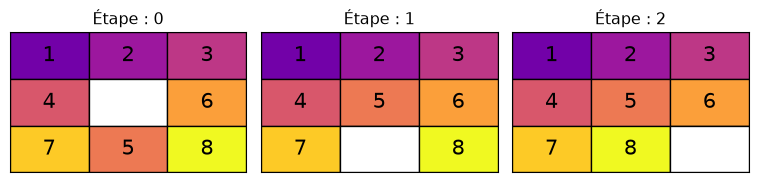

In [15]:
plt.figure(figsize=(8, 2))

initial_state_8 = [1, 2, 3,
                   4, 0, 6,
                   7, 5, 8]
goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

solutions = best_first_search(initial_state_8, goal_state_8)

for i, solution in enumerate(solutions):
    plot_board(solution, f"Étape : {i}", 3, i+1)

plt.tight_layout()
plt.show()

In [16]:
initial_state_8 = [1, 2, 3,
                   4, 0, 6,
                   7, 5, 8]
goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

best_first_search(initial_state_8, goal_state_8)

Nombre d'itérations : 2

[[1, 2, 3, 4, 0, 6, 7, 5, 8],
 [1, 2, 3, 4, 5, 6, 7, 0, 8],
 [1, 2, 3, 4, 5, 6, 7, 8, 0]]

## Cas difficile

In [17]:
initial_state_8 = [6, 4, 5,
                   8, 2, 7,
                   1, 0, 3]
goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

print("Résolution du casse-tête de 8 tuiles avec best_first_search...")

solution_8_bfs = best_first_search(initial_state_8, goal_state_8)

if solution_8_bfs:
    print(f"Solution trouvée par best_first_search en {len(solution_8_bfs) - 1} mouvements :")
    print_solution(solution_8_bfs)
else:
    print("Aucune solution trouvée pour le casse-tête de 8 tuiles avec best_first_search.")

Résolution du casse-tête de 8 tuiles avec best_first_search...
Nombre d'itérations : 29005
Solution trouvée par best_first_search en 25 mouvements :
Étape 0 :
6 4 5
8 2 7
1   3

Étape 1 :
6 4 5
8 2 7
  1 3

Étape 2 :
6 4 5
  2 7
8 1 3

Étape 3 :
6 4 5
2   7
8 1 3

Étape 4 :
6   5
2 4 7
8 1 3

Étape 5 :
  6 5
2 4 7
8 1 3

Étape 6 :
2 6 5
  4 7
8 1 3

Étape 7 :
2 6 5
4   7
8 1 3

Étape 8 :
2 6 5
4 1 7
8   3

Étape 9 :
2 6 5
4 1 7
  8 3

Étape 10 :
2 6 5
  1 7
4 8 3

Étape 11 :
2 6 5
1   7
4 8 3

Étape 12 :
2 6 5
1 7  
4 8 3

Étape 13 :
2 6 5
1 7 3
4 8  

Étape 14 :
2 6 5
1 7 3
4   8

Étape 15 :
2 6 5
1   3
4 7 8

Étape 16 :
2   5
1 6 3
4 7 8

Étape 17 :
2 5  
1 6 3
4 7 8

Étape 18 :
2 5 3
1 6  
4 7 8

Étape 19 :
2 5 3
1   6
4 7 8

Étape 20 :
2   3
1 5 6
4 7 8

Étape 21 :
  2 3
1 5 6
4 7 8

Étape 22 :
1 2 3
  5 6
4 7 8

Étape 23 :
1 2 3
4 5 6
  7 8

Étape 24 :
1 2 3
4 5 6
7   8

Étape 25 :
1 2 3
4 5 6
7 8  


## 8-Puzzle

In [18]:
def manhattan_distance(state, goal_state):
    distance = 0
    size = int(len(state) ** 0.5)
    for num in range(1, len(state)):
        idx1 = state.index(num)
        idx2 = goal_state.index(num)
        x1, y1 = idx1 % size, idx1 // size
        x2, y2 = idx2 % size, idx2 // size
        distance += abs(x1 - x2) + abs(y1 - y2)
    return distance

$$
    h_{\mathrm{Manathan}}(s) = \sum_{t \in \{1,\ldots,8\}} (|x_t - x_t^\star| + |y_t - y_t^\star|)
$$

Calcule l’heuristique de **distance de Manhattan** pour un état donné.
Est-ce que cette heuristique est **admissible**?

Considérez une version simplifiée du 8-puzzle dans laquelle une tuile
peut se déplacer vers n’importe quelle case adjacente
(haut/bas/gauche/droite) sans avoir besoin du vide. Dans ce puzzle
simplifié, le nombre exact de mouvements nécessaires à partir d’un état
est précisément la distance totale de Manhattan (chaque mouvement réduit
la distance d’une tuile de 1 et vous pouvez toujours déplacer
directement la tuile nécessaire). Le coût optimal de tout problème
simplifié est une borne inférieure du coût optimal du problème original,
par conséquent la distance de Manhattan est admissible pour le véritable
taquin 8-puzzle.

## 8-Puzzle

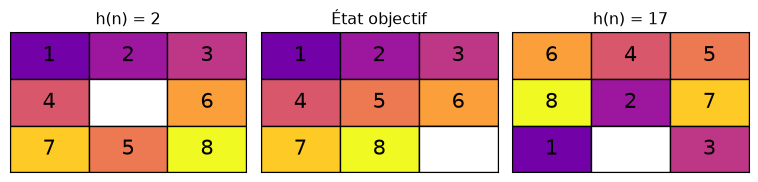

In [19]:
plt.figure(figsize=(8, 2))

initial_state_8a = [1, 2, 3,
                    4, 0, 6,
                    7, 5, 8]

initial_state_8b = [6, 4, 5,
                    8, 2, 7,
                    1, 0, 3]

goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

distance_a = manhattan_distance(initial_state_8a, goal_state_8)

distance_b = manhattan_distance(initial_state_8b, goal_state_8)

plot_board(initial_state_8a, f"h(n) = {distance_a}", 3, 1)

plot_board(goal_state_8, "État objectif", 3, 2)

plot_board(initial_state_8b, f"h(n) = {distance_b}", 3, 3)

plt.tight_layout()
plt.show()

## 8-Puzzle

- Comparer les heuristiques **Manhattan** et **Tuiles Mal Placées**.
- Laquelle est la plus efficace ?
- Différences significatives de temps d’exécution ?

## 8-Puzzle

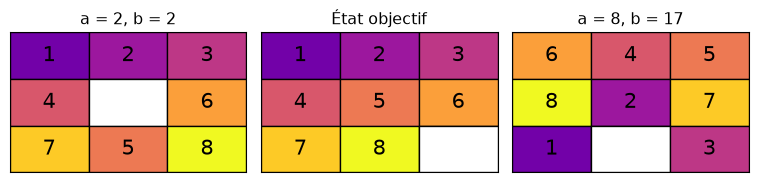

In [20]:
plt.figure(figsize=(8, 2))

initial_state_8a = [1, 2, 3,
                    4, 0, 6,
                    7, 5, 8]

initial_state_8b = [6, 4, 5,
                    8, 2, 7,
                    1, 0, 3]

goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

distance_a_mis = misplaced_tiles_distance(initial_state_8a, goal_state_8)
distance_b_mis = misplaced_tiles_distance(initial_state_8b, goal_state_8)

distance_a_man = manhattan_distance(initial_state_8a, goal_state_8)
distance_b_man = manhattan_distance(initial_state_8b, goal_state_8)

plot_board(initial_state_8a, f"a = {distance_a_mis}, b = {distance_a_man}", 3, 1)

plot_board(goal_state_8, "État objectif", 3, 2)

plot_board(initial_state_8b, f"a = {distance_b_mis}, b = {distance_b_man}", 3, 3)

plt.tight_layout()
plt.show()

où

- **a** = distance des tuiles mal placées
- **b** = distance de Manathan

## 8-Puzzle

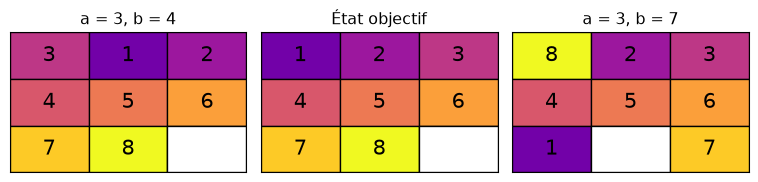

In [21]:
plt.figure(figsize=(8, 2))

initial_state_8a = [3, 1, 2,
                    4, 5, 6,
                    7, 8, 0]

initial_state_8b = [8, 2, 3,
                    4, 5, 6,
                    1, 0, 7]

goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

distance_a_mis = misplaced_tiles_distance(initial_state_8a, goal_state_8)
distance_b_mis = misplaced_tiles_distance(initial_state_8b, goal_state_8)

distance_a_man = manhattan_distance(initial_state_8a, goal_state_8)
distance_b_man = manhattan_distance(initial_state_8b, goal_state_8)

plot_board(initial_state_8a, f"a = {distance_a_mis}, b = {distance_a_man}", 3, 1)

plot_board(goal_state_8, "État objectif", 3, 2)

plot_board(initial_state_8b, f"a = {distance_b_mis}, b = {distance_b_man}", 3, 3)

plt.tight_layout()
plt.show()

où

- **a** = distance des tuiles mal placées
- **b** = distance de Manhattan

`misplaced_tiles_distance` ne tient pas compte de la distance d’une
tuile par rapport à sa position finale prévue, tandis que
`manhattan_distance` le fait.

Ainsi, on peut s’attendre à ce que l’algorithme utilisant la distance de
Manhattan sélectionne le prochain nœud à explorer de manière plus
judicieuse.

## Recherche du meilleur d’abord

In [22]:
def best_first_search_revised(initial_state, goal_state):
    frontier = [] # Initialiser la file de priorité
    initial_h = manhattan_distance(initial_state, goal_state)
    # Ajouter l'état initial avec sa valeur heuristique dans la file
    heapq.heappush(frontier, (initial_h, 0, initial_state, [])) # (f(n), g(n), état, chemin)

    explored = set()
    explored.add(tuple(initial_state))
    iterations = 0

    while not is_empty(frontier):
        f, g, current_state, path = heapq.heappop(frontier)

        if is_goal(current_state, goal_state):
            print(f"Nombre d'itérations : {iterations}")
            return path + [current_state] # Retourner le chemin réussi

        iterations = iterations + 1

        for neighbor in expand(current_state):
            if tuple(neighbor) not in explored:
                new_g = g + 1 # Incrémenter le coût du chemin
                h = manhattan_distance(neighbor, goal_state)
                new_f = new_g + h # Calculer le nouveau coût total
                # Ajouter l'état voisin dans la file de priorité
                heapq.heappush(frontier, (new_f, new_g, neighbor, path + [current_state]))
                explored.add(tuple(neighbor)) # Marquer le voisin comme exploré

    return None # Aucune solution trouvée

Lors de l’expansion d’un nœud dans l’arbre de recherche, il est crucial
de noter que nous n’évaluons pas immédiatement ses nœuds descendants
pour déterminer s’ils sont des nœuds objectifs. Au lieu de cela, ces
descendants sont ajoutés à la frontière, qui est une file de priorité.
Cela permet de comparer leurs valeurs $f(n)$ avec celles des autres
nœuds dans la frontière, garantissant que les nœuds les plus prometteurs
sont considérés en premier en fonction de leur coût total estimé.

Par conséquent, il est possible que la frontière inclue des nœuds qui
sont des nœuds objectifs. Cependant, leurs valeurs $f(n)$ peuvent être
plus élevées que celles d’autres nœuds jugés plus prometteurs, car ces
autres nœuds pourraient mener à un chemin plus court vers l’objectif.

## Cas simple

Nombre d'itérations : 2

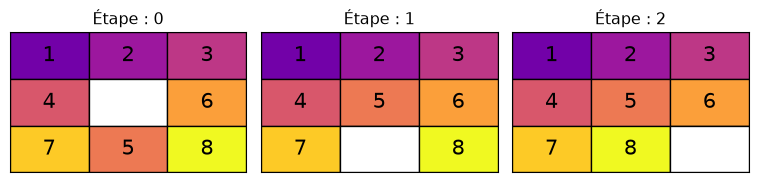

In [23]:
plt.figure(figsize=(8, 2))

initial_state_8 = [1, 2, 3,
                   4, 0, 6,
                   7, 5, 8]

goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

solutions = best_first_search_revised(initial_state_8, goal_state_8)

for i, solution in enumerate(solutions):
    plot_board(solution, f"Étape : {i}", 3, i+1)

plt.tight_layout()
plt.show()

In [24]:
initial_state_8 = [1, 2, 3,
                   4, 0, 6,
                   7, 5, 8]

goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

best_first_search_revised(initial_state_8, goal_state_8)

Nombre d'itérations : 2

[[1, 2, 3, 4, 0, 6, 7, 5, 8],
 [1, 2, 3, 4, 5, 6, 7, 0, 8],
 [1, 2, 3, 4, 5, 6, 7, 8, 0]]

## Cas difficile

In [25]:
initial_state_8 = [6, 4, 5,
                   8, 2, 7,
                   1, 0, 3]

goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

print("Résolution du 8-Puzzle avec best_first_search...")

solution_8_bfs = best_first_search_revised(initial_state_8, goal_state_8)

if solution_8_bfs:
    print(f"Solution best_first_search trouvée en {len(solution_8_bfs) - 1} mouvements :")
    print_solution(solution_8_bfs)
else:
    print("Aucune solution trouvée pour le 8-Puzzle en utilisant best_first_search.")

Résolution du 8-Puzzle avec best_first_search...
Nombre d'itérations : 2255
Solution best_first_search trouvée en 25 mouvements :
Étape 0 :
6 4 5
8 2 7
1   3

Étape 1 :
6 4 5
8 2 7
  1 3

Étape 2 :
6 4 5
  2 7
8 1 3

Étape 3 :
6 4 5
2   7
8 1 3

Étape 4 :
6   5
2 4 7
8 1 3

Étape 5 :
  6 5
2 4 7
8 1 3

Étape 6 :
2 6 5
  4 7
8 1 3

Étape 7 :
2 6 5
4   7
8 1 3

Étape 8 :
2 6 5
4 1 7
8   3

Étape 9 :
2 6 5
4 1 7
  8 3

Étape 10 :
2 6 5
  1 7
4 8 3

Étape 11 :
2 6 5
1   7
4 8 3

Étape 12 :
2 6 5
1 7  
4 8 3

Étape 13 :
2 6 5
1 7 3
4 8  

Étape 14 :
2 6 5
1 7 3
4   8

Étape 15 :
2 6 5
1   3
4 7 8

Étape 16 :
2   5
1 6 3
4 7 8

Étape 17 :
2 5  
1 6 3
4 7 8

Étape 18 :
2 5 3
1 6  
4 7 8

Étape 19 :
2 5 3
1   6
4 7 8

Étape 20 :
2   3
1 5 6
4 7 8

Étape 21 :
  2 3
1 5 6
4 7 8

Étape 22 :
1 2 3
  5 6
4 7 8

Étape 23 :
1 2 3
4 5 6
  7 8

Étape 24 :
1 2 3
4 5 6
7   8

Étape 25 :
1 2 3
4 5 6
7 8  


## Expérimentation

In [26]:
def best_first_search_count(initial_state, goal_state):
    frontier = [] # Initialiser la file de priorité
    initial_h = misplaced_tiles_distance(initial_state, goal_state)
    # Ajouter l'état initial avec sa valeur heuristique dans la file
    heapq.heappush(frontier, (initial_h, 0, initial_state, [])) # (f(n), g(n), état, chemin)

    explored = set()

    iterations = 0

    while not is_empty(frontier):
        f, g, current_state, path = heapq.heappop(frontier)

        if is_goal(current_state, goal_state):
            return len(path), iterations

        iterations = iterations + 1

        explored.add(tuple(current_state))

        for neighbor in expand(current_state):
            if tuple(neighbor) not in explored:
                new_g = g + 1 # Incrémenter le coût du chemin
                h = misplaced_tiles_distance(neighbor, goal_state)
                new_f = new_g + h # Calculer le nouveau coût total
                # Ajouter l'état voisin dans la file de priorité
                heapq.heappush(frontier, (new_f, new_g, neighbor, path + [current_state]))
                explored.add(tuple(neighbor)) # Marquer le voisin comme exploré

    return None, None # Aucune solution trouvée

In [27]:
def best_first_search_revised_count(initial_state, goal_state):
    frontier = [] # Initialiser la file de priorité
    initial_h = manhattan_distance(initial_state, goal_state)
    # Ajouter l'état initial avec sa valeur heuristique dans la file
    heapq.heappush(frontier, (initial_h, 0, initial_state, [])) # (f(n), g(n), état, chemin)

    explored = set()

    iterations = 0

    while not is_empty(frontier):
        f, g, current_state, path = heapq.heappop(frontier)

        if is_goal(current_state, goal_state):
            return len(path), iterations

        iterations = iterations + 1

        explored.add(tuple(current_state))

        for neighbor in expand(current_state):
            if tuple(neighbor) not in explored:
                new_g = g + 1 # Incrémenter le coût du chemin
                h = manhattan_distance(neighbor, goal_state)
                new_f = new_g + h # Calculer le nouveau coût total
                # Ajouter l'état voisin dans la file de priorité
                heapq.heappush(frontier, (new_f, new_g, neighbor, path + [current_state]))
                explored.add(tuple(neighbor)) # Marquer le voisin comme exploré

    return None, None # Aucune solution trouvée

Nous introduisons deux nouvelles fonctions : chacune renvoie la longueur
de la solution ainsi que le nombre d’itérations effectuées. Ces
fonctions seront utilisées dans nos prochaines analyses expérimentales.

## 1000 Expériences

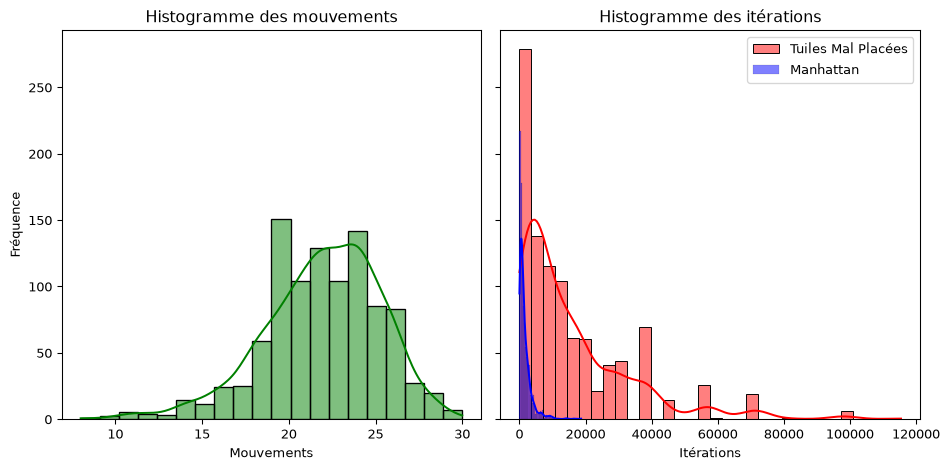

In [28]:
goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

moves = []
iterations_a = []
iterations_b = []

for i in range(1000):
    initial_state_8 = generate_solvable_board()
    nb_moves, nb_iterations_a = best_first_search_count(initial_state_8, goal_state_8)
    nb_moves, nb_iterations_b = best_first_search_revised_count(initial_state_8, goal_state_8)
    moves.append(nb_moves)
    iterations_a.append(nb_iterations_a)
    iterations_b.append(nb_iterations_b)

import seaborn as sns
import matplotlib.pyplot as plt

# Configurer la structure des sous-graphiques
fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharey=True)

# Tracer l'histogramme pour `moves`
sns.histplot(moves, bins=20, kde=True, color='green', ax=axes[0], edgecolor='black')
axes[0].set_title("Histogramme des mouvements")
axes[0].set_xlabel("Mouvements")
axes[0].set_ylabel("Fréquence")

# Tracer l'histogramme pour `iterations`
sns.histplot(iterations_a, kde=True, color='red', ax=axes[1], edgecolor='black', label="Tuiles Mal Placées")

# Tracer l'histogramme pour `iterations`
sns.histplot(iterations_b, kde=True, color='blue', ax=axes[1], edgecolor='black', label="Manhattan")
axes[1].set_title("Histogramme des itérations")
axes[1].set_xlabel("Itérations")

# Afficher le graphique
plt.legend()
plt.tight_layout()
plt.show()

## Diagramme de dispersion

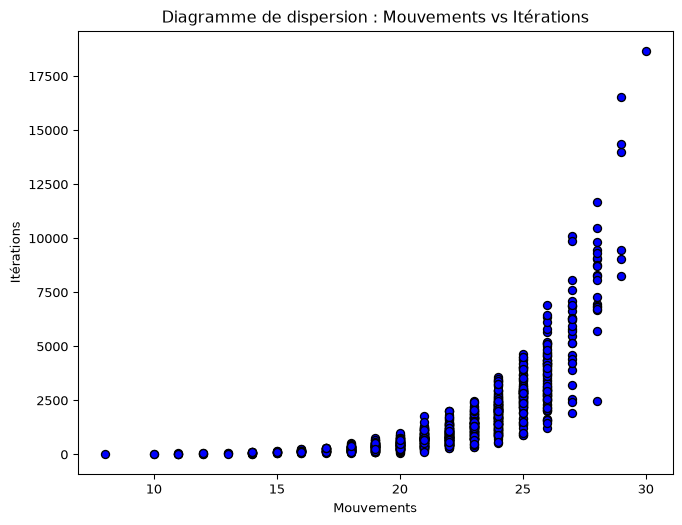

In [29]:
# Créer un diagramme de dispersion

plt.figure(figsize=(8, 6))
plt.scatter(moves, iterations_b, color='blue', edgecolor='black')

# Ajouter des titres et des étiquettes
plt.title("Diagramme de dispersion : Mouvements vs Itérations")
plt.xlabel("Mouvements")
plt.ylabel("Itérations")

# Afficher le graphique
plt.show()

(Manhattan)

## Exploration

La recherche en largeur (BFS) garantit de trouver le chemin le plus
court, ou la solution de coût le plus bas, en supposant que toutes les
actions ont un coût unitaire.

Développez un programme qui effectue les tâches suivantes :

1.  Générer une configuration aléatoire du puzzle 8-Puzzle.
2.  Déterminer le chemin le plus court en utilisant la recherche en
    largeur.
3.  Identifier la solution optimale en utilisant l’algorithme $A^\star$.
4.  Comparer les coûts des solutions obtenues aux étapes 2 et 3. Il ne
    devrait pas y avoir de différence si $A^\star$ identifie des
    solutions optimales en termes de coût.
5.  Répéter le processus.

## Exploration

L’heuristique $h(n) = 0$ est considérée comme admissible, mais elle
entraîne généralement une exploration inefficace de l’espace de
recherche. Développez un programme pour explorer ce concept. Montrez
que, lorsque toutes les actions sont supposées avoir un coût unitaire,
$A^\star$ et la recherche en largeur (BFS) explorent l’espace de
recherche de manière similaire. Plus précisément, ils examinent d’abord
tous les chemins de longueur un, puis ceux de longueur deux, et ainsi de
suite.

## Remarques

- La **recherche en largeur (BFS)** identifie la solution optimale, 25
  mouvements, en 145 605 itérations.

- La **recherche en profondeur (DFS)** découvre une solution impliquant
  1 157 mouvements en 1 187 itérations.

- La **recherche du meilleur d’abord** identifie la solution optimale,
  25 mouvements, en 2 255 itérations.

## Évaluation de la performance

- **Complétude** : L’algorithme assure-t-il qu’une solution sera trouvée
  si elle existe et indique-t-il correctement l’absence de solution
  lorsqu’aucune solution n’existe ?

- **Optimalité du coût** : L’algorithme identifie-t-il la solution avec
  le **coût de chemin le plus bas** parmi toutes les solutions possibles
  ?

- Les trois algorithmes sont-ils complets ? Quelles sont les conditions
  nécessaires ?

- Tous les trois algorithmes garantissent-ils l’optimalité du coût ?

## Évaluation de la performance

- **Complexité temporelle** : Comment le **temps** requis par
  l’algorithme évolue-t-il par rapport au **nombre d’états** et
  d’**actions** ?

- **Complexité spatiale** : Comment l’**espace** requis par l’algorithme
  évolue-t-il par rapport au **nombre d’états** et d’**actions** ?

Alternativement, la complexité peut être évaluée en fonction de la
**profondeur** ($d$) et du **facteur de branchement** ($b$) de l’arbre
de recherche, plutôt qu’en fonction du nombre d’états (nœuds) et
d’actions (arêtes) dans l’espace d’états.

## Vidéos par Sebastian Lague

- [A\* Pathfinding (E01 : explication de
  l’algorithme)](https://www.youtube.com/watch?v=-L-WgKMFuhE) publié le
  2014-12-16.
- [A\* Pathfinding (E02 : grille de
  nœuds)](https://www.youtube.com/watch?v=nhiFx28e7JY) publié le
  2014-12-18.
- [A\* Pathfinding (E03 : implémentation de
  l’algorithme)](https://www.youtube.com/watch?v=mZfyt03LDH4) publié le
  2014-12-19.
- [A\* Pathfinding (E04 : optimisation du
  tas)](https://www.youtube.com/watch?v=3Dw5d7PlcTM) publié le
  2014-12-24.
- [A\* Pathfinding (E05 :
  unités)](https://www.youtube.com/watch?v=dn1XRIaROM4) publié le
  2015-01-06.
- [A\* Pathfinding (E06 :
  poids)](https://www.youtube.com/watch?v=T0Qv4-KkAUo) publié le
  2015-01-11.
- [A\* Pathfinding (E07 : poids
  lissés)](https://www.youtube.com/watch?v=Tb-rM3wGwv4) publié le
  2016-12-30.
- [A\* Pathfinding (E08 : lissage de chemin
  1/2)](https://www.youtube.com/watch?v=NjQjl-ZBXoY) publié le
  2017-01-31.
- [A\* Pathfinding (E09 : lissage de chemin
  2/2)](https://www.youtube.com/watch?v=bfevcsANSr4) publié le
  2017-01-31.
- [A\* Pathfinding (E10 :
  threading)](https://www.youtube.com/watch?v=TFyEWDMQUKc) publié le
  2017-02-03.
- [Tutoriel A\* Pathfinding
  (Unity)](https://www.youtube.com/playlist?list=PLFt_AvWsXl0cq5Umv3pMC9SPnKjfp9eGW)
  (liste de lecture)

## Une ressource dédiée à $A^\star$

- [Amit’s A\* Pages](http://theory.stanford.edu/~amitp/GameProgramming/)

# Prologue

## Résumé

- Recherche informée et heuristiques
- Recherche du meilleur d’abord
- Implémentations

- **Recherche informée et heuristiques :**
  - Introduit le concept de **fonctions heuristiques** (`h(n)`) pour
    estimer les coûts.
  - **Recherche du meilleur d’abord :**
    - Utilise des heuristiques pour prioriser les nœuds qui semblent
      plus proches de l’objectif.
    - Implémenté avec une file de priorité triée par coût estimé.
  - **Heuristique de distance de Manhattan :**
    - Calcule la somme des distances des tuiles par rapport à leurs
      positions cibles.
    - Utilisé dans le 8-Puzzle pour guider la recherche plus
      efficacement.
- **Analyse comparative :**
  - **BFS :** Solution optimale en 145 605 itérations (25 mouvements).
  - **DFS :** Solution sous-optimale en 1 187 itérations (1 157
    mouvements).
  - **Recherche du meilleur d’abord :** Solution optimale en 2 255
    itérations (25 mouvements).
  - Démontré que les algorithmes de recherche informée peuvent trouver
    des solutions optimales plus efficacement.

## Prochain cours

- Nous explorerons plus en détail les fonctions heuristiques et
  examinerons d’autres algorithmes de recherche.

## Références

Hart, Peter E., Nils J. Nilsson, et Bertram Raphael. 1968. « A Formal
Basis for the Heuristic Determination of Minimum Cost Paths ». *IEEE
Transactions on Systems Science and Cybernetics* 4 (2): 100‑107.
<https://doi.org/10.1109/tssc.1968.300136>.

Russell, Stuart, et Peter Norvig. 2020. *Artificial Intelligence: A
Modern Approach*. 4ᵉ éd. Pearson. <http://aima.cs.berkeley.edu/>.

------------------------------------------------------------------------

Marcel **Turcotte**

<Marcel.Turcotte@uOttawa.ca>

École de **science informatique** et de génie électrique (**SI**GE)

Université d’Ottawa